<a href="https://colab.research.google.com/github/Yashaswini-Sridhar/AirPhyNet/blob/main/Satellite_%26_Aerial_Image_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%cd SkyScanAI-main

/content/SkyScanAI-main


In [ ]:
!pip install -r /content/SkyScanAI-main/requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 61.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-2-6 Python-3.11.11 torch-2.5.1+cu124 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:894: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 3419x2642 3 persons, 7 cars, 1 truck
Speed: 11.0ms pre-process, 325.9ms inference, 1.3ms NMS per image at shape (1, 3, 640, 512)


Detected pollution sources:
           xmin         ymin         xmax         ymax  confidence  class  \
0    727.473450  2486.504883   939.193359  2657.879395    0.754042      2   
2   1772.594604  2526.715820  1920.734375  2688.468506    0.646340      2   
4   1896.369751  2511.573486  2238.388184  2726.625977    0.615521      2   
6   1431.969727  2483.842773  1502.375122  2528.538574    0.375655      2   
7   1170.193481  2475.313232  1231.803833  2543.989746    0.357959      2   
8   1007.357361  2408.823730  1156.804932  2553.674072    0.355548      7   
9   1355.167114  2483.551758  1423.806641  2530.543213    0.344522      2   
10  1516.068237  2482.375732  1606.376099  2572.483154    0.258038      2   

     name  
0     car  
2     car  
4     car  
6     car  
7     car  
8   truck  
9     car  
10    car  


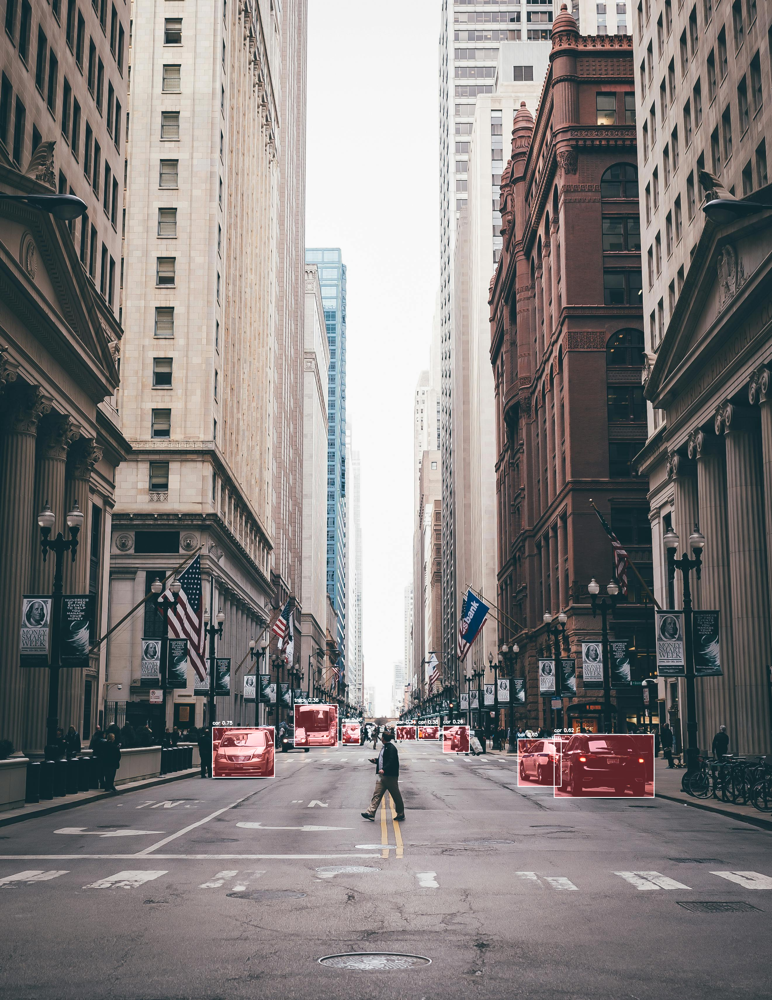

In [ ]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


def load_image(image_path):
    """
    Load an image from disk and convert it from BGR to RGB.
    """
    # Read image with OpenCV (BGR format)
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image at path '{image_path}' not found.")
    # Convert BGR to RGB for correct color representation in matplotlib
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb


def create_pollution_mask(img, detections):
    """
    Create a mask highlighting potential pollution areas.
    """
    mask = np.zeros_like(img)
    for det in detections:
        x1, y1, x2, y2 = map(int, det[:4])
        # Fill the detection area with red color with 50% transparency
        mask[y1:y2, x1:x2] = [255, 0, 0]
    return mask


def display_detections(img, detections, class_names):
    """
    Draw bounding boxes and pollution overlay on the image.
    """
    img_draw = img.copy()

    # Create and apply pollution mask
    mask = create_pollution_mask(img, detections)
    img_draw = cv2.addWeighted(img_draw, 1, mask, 0.3, 0)

    # Draw bounding boxes
    for det in detections:
        x1, y1, x2, y2, conf, cls = det
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
        label = f"{class_names[int(cls)]} {conf:.2f}"

        cv2.rectangle(img_draw, (x1, y1), (x2, y2), color=(255, 255, 255), thickness=2)
        cv2.putText(
            img_draw,
            label,
            (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (255, 255, 255),
            thickness=2,
        )

    plt.figure(figsize=(20, 12), dpi=300)  # Increased figure size and DPI
    plt.imshow(img_draw)
    plt.axis("off")
    plt.title("Detected Pollution Sources with Impact Areas")
    plt.savefig(
        "AnalyzeImages/output/output.png", dpi=300, bbox_inches="tight", pad_inches=0
    )
    display(Image.fromarray(img_draw))


def filter_pollution_sources(detections_df):
    """
    Filter detections to only include air pollution sources.
    """
    # Define classes that are typically pollution sources
    pollution_sources = [
        "car",
        "truck",
        "bus",
        "motorcycle",
        "train",
        "boat",
        "airplane",
    ]

    # Filter the DataFrame to only include pollution sources
    filtered_df = detections_df[detections_df["name"].isin(pollution_sources)]
    return filtered_df


def main():
    # Replace with your local image path
    image_path = "AnalyzeImages/2.jpg"

    # Load the image
    img = load_image(image_path)

    # Load the pretrained YOLOv5s model from the Ultralytics repository.
    # Source: https://github.com/ultralytics/yolov5
    model = torch.hub.load("ultralytics/yolov5", "yolov5s", pretrained=True)

    # Run inference on the image.
    results = model(img)

    # Print the inference results to the console.
    results.print()

    # Convert results to a pandas DataFrame.
    detections_df = results.pandas().xyxy[0]
    detections_df = filter_pollution_sources(detections_df)
    print("Detected pollution sources:")
    print(detections_df)

    # Extract filtered detections as a list
    detections = []
    for _, row in detections_df.iterrows():
        detections.append(
            [
                row["xmin"],
                row["ymin"],
                row["xmax"],
                row["ymax"],
                row["confidence"],
                row["class"],
            ]
        )

    # Get the mapping of class indices to names
    class_names = results.names

    # Display the image with the detected bounding boxes.
    display_detections(img, detections, class_names)


if __name__ == "__main__":
    main()


Deforestation: 22.38% of the area has changed.
Afforestation: 5.57% of the area has changed.
Plot saved to SatelliteImageryAnalysis/output/NEW_AD(2009-2019).png


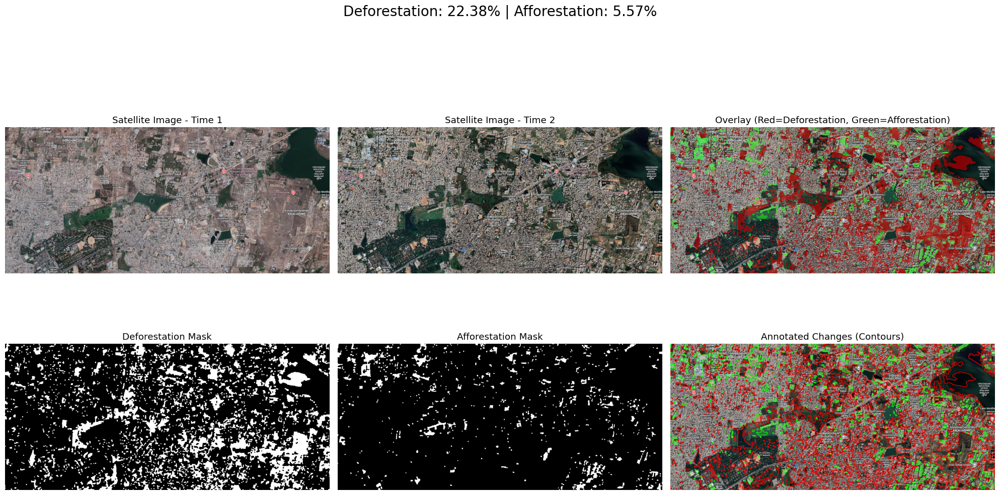

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


def load_image(image_path):
    """
    Load an image from disk using OpenCV and convert from BGR to RGB.

    Args:
        image_path (str): Path to the image file.

    Returns:
        np.ndarray: RGB image.
    """
    img_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if img_bgr is None:
        raise FileNotFoundError(f"Image at path '{image_path}' not found.")
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb


def register_images(img1, img2):
    """
    Placeholder for image registration. Assumes that the images are already aligned.

    Args:
        img1 (np.ndarray): First image.
        img2 (np.ndarray): Second image.

    Returns:
        Tuple[np.ndarray, np.ndarray]: Registered images.
    """
    if img1.shape != img2.shape:
        raise ValueError(
            "Input images must have the same dimensions for proper registration."
        )
    return img1, img2


def change_detection(
    img1, img2, threshold_deforestation=-20, threshold_afforestation=20, kernel_size=5
):
    """
    Detect changes between two images by analyzing the Value (V) channel in HSV color space.
    A decrease in brightness indicates potential deforestation, while an increase indicates afforestation.

    Args:
        img1 (np.ndarray): First image (earlier date).
        img2 (np.ndarray): Second image (later date).
        threshold_deforestation (int): Threshold for decrease in V channel to indicate deforestation.
        threshold_afforestation (int): Threshold for increase in V channel to indicate afforestation.
        kernel_size (int): Size of the kernel for morphological operations.

    Returns:
        Tuple[np.ndarray, np.ndarray]: Cleaned binary masks for deforestation and afforestation.
    """
    # Convert images to HSV color space
    hsv1 = cv2.cvtColor(img1, cv2.COLOR_RGB2HSV)
    hsv2 = cv2.cvtColor(img2, cv2.COLOR_RGB2HSV)

    # Extract the Value channel as a proxy for vegetation intensity
    value1 = hsv1[:, :, 2]
    value2 = hsv2[:, :, 2]

    # Compute the difference in the Value channel (later - earlier)
    diff_value = value2.astype(np.int16) - value1.astype(np.int16)

    # Initialize binary masks for deforestation and afforestation
    deforestation_mask = np.zeros_like(diff_value, dtype=np.uint8)
    afforestation_mask = np.zeros_like(diff_value, dtype=np.uint8)

    # Mark pixels where the decrease/increase in brightness exceeds thresholds
    deforestation_mask[diff_value < threshold_deforestation] = 255
    afforestation_mask[diff_value > threshold_afforestation] = 255

    # Create a kernel for morphological operations
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # Clean up the masks using morphological opening and closing
    deforestation_mask_clean = cv2.morphologyEx(
        deforestation_mask, cv2.MORPH_OPEN, kernel
    )
    deforestation_mask_clean = cv2.morphologyEx(
        deforestation_mask_clean, cv2.MORPH_CLOSE, kernel
    )

    afforestation_mask_clean = cv2.morphologyEx(
        afforestation_mask, cv2.MORPH_OPEN, kernel
    )
    afforestation_mask_clean = cv2.morphologyEx(
        afforestation_mask_clean, cv2.MORPH_CLOSE, kernel
    )

    return deforestation_mask_clean, afforestation_mask_clean


def analyze_changes(deforestation_mask, afforestation_mask):
    """
    Calculate the percentage of the area that has changed for both deforestation and afforestation.

    Args:
        deforestation_mask (np.ndarray): Binary mask for deforestation.
        afforestation_mask (np.ndarray): Binary mask for afforestation.

    Returns:
        Tuple[float, float]: Percentage of deforestation and afforestation.
    """

    def compute_percentage(mask):
        total_area = mask.shape[0] * mask.shape[1]
        changed_area = np.count_nonzero(mask)
        return (changed_area / total_area) * 100

    percent_deforestation = compute_percentage(deforestation_mask)
    percent_afforestation = compute_percentage(afforestation_mask)
    return percent_deforestation, percent_afforestation


def draw_contours(image, deforestation_mask, afforestation_mask):
    """
    Draw contours on the image from the provided binary masks.
    Red contours indicate deforestation and green contours indicate afforestation.

    Args:
        image (np.ndarray): Original RGB image.
        deforestation_mask (np.ndarray): Binary mask for deforestation.
        afforestation_mask (np.ndarray): Binary mask for afforestation.

    Returns:
        np.ndarray: Annotated image with drawn contours.
    """
    annotated_img = image.copy()
    # Convert to BGR for drawing (OpenCV uses BGR)
    annotated_img_bgr = cv2.cvtColor(annotated_img, cv2.COLOR_RGB2BGR)

    # Find contours for deforestation (red)
    contours_deforestation, _ = cv2.findContours(
        deforestation_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    cv2.drawContours(annotated_img_bgr, contours_deforestation, -1, (0, 0, 255), 2)

    # Find contours for afforestation (green)
    contours_afforestation, _ = cv2.findContours(
        afforestation_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    cv2.drawContours(annotated_img_bgr, contours_afforestation, -1, (0, 255, 0), 2)

    # Convert back to RGB for display
    annotated_img_rgb = cv2.cvtColor(annotated_img_bgr, cv2.COLOR_BGR2RGB)
    return annotated_img_rgb


def overlay_mask(image, deforestation_mask, afforestation_mask, alpha=0.5):
    """
    Overlay the deforestation and afforestation masks on the image.
    Red overlay indicates deforestation and green overlay indicates afforestation.

    Args:
        image (np.ndarray): Original RGB image.
        deforestation_mask (np.ndarray): Binary mask for deforestation.
        afforestation_mask (np.ndarray): Binary mask for afforestation.
        alpha (float): Blending factor.

    Returns:
        np.ndarray: Image with overlays.
    """
    overlay = image.copy()

    # Create color masks for deforestation (red) and afforestation (green)
    red_mask = np.zeros_like(image)
    red_mask[:, :, 0] = 255  # Red channel

    green_mask = np.zeros_like(image)
    green_mask[:, :, 1] = 255  # Green channel

    # Convert masks to boolean arrays
    defo_bool = deforestation_mask.astype(bool)
    affo_bool = afforestation_mask.astype(bool)

    # Blend the red mask on areas of deforestation
    overlay[defo_bool] = cv2.addWeighted(
        overlay[defo_bool], 1 - alpha, red_mask[defo_bool], alpha, 0
    )

    # Blend the green mask on areas of afforestation
    overlay[affo_bool] = cv2.addWeighted(
        overlay[affo_bool], 1 - alpha, green_mask[affo_bool], alpha, 0
    )

    return overlay


def plot_results(
    img1,
    img2,
    overlay_img,
    deforestation_mask,
    afforestation_mask,
    annotated_img,
    percent_deforestation,
    percent_afforestation,
    save_path=None,
):
    """
    Plot the original images, overlay, masks, and annotated image with percentage changes.
    Optionally save the plot to disk.

    Args:
        img1 (np.ndarray): Image from time 1.
        img2 (np.ndarray): Image from time 2.
        overlay_img (np.ndarray): Image with overlay masks.
        deforestation_mask (np.ndarray): Binary deforestation mask.
        afforestation_mask (np.ndarray): Binary afforestation mask.
        annotated_img (np.ndarray): Image annotated with contours.
        percent_deforestation (float): Percentage change for deforestation.
        percent_afforestation (float): Percentage change for afforestation.
        save_path (str, optional): Path to save the resulting plot. Defaults to None.
    """
    fig, axs = plt.subplots(2, 3, figsize=(20, 12))

    axs[0, 0].imshow(img1)
    axs[0, 0].set_title("Satellite Image - Time 1")
    axs[0, 0].axis("off")

    axs[0, 1].imshow(img2)
    axs[0, 1].set_title("Satellite Image - Time 2")
    axs[0, 1].axis("off")

    axs[0, 2].imshow(overlay_img)
    axs[0, 2].set_title("Overlay (Red=Deforestation, Green=Afforestation)")
    axs[0, 2].axis("off")

    axs[1, 0].imshow(deforestation_mask, cmap="gray")
    axs[1, 0].set_title("Deforestation Mask")
    axs[1, 0].axis("off")

    axs[1, 1].imshow(afforestation_mask, cmap="gray")
    axs[1, 1].set_title("Afforestation Mask")
    axs[1, 1].axis("off")

    axs[1, 2].imshow(annotated_img)
    axs[1, 2].set_title("Annotated Changes (Contours)")
    axs[1, 2].axis("off")

    # Add percentage change text
    plt.suptitle(
        f"Deforestation: {percent_deforestation:.2f}% | Afforestation: {percent_afforestation:.2f}%",
        fontsize=20,
        y=0.95,
    )

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    if save_path:
        plt.savefig(save_path)
        print(f"Plot saved to {save_path}")
        display(fig)
    plt.show()



def main():
    # ------------------------ User Settings ------------------------
    image1_path = "SatelliteImageryAnalysis/2009.png"  # Image from an earlier date
    image2_path = "SatelliteImageryAnalysis/2019.png"  # Image from a later date
    output_plot_path = "SatelliteImageryAnalysis/output/NEW_AD(2009-2019).png"
    # -----------------------------------------------------------------

    # Load the images
    img1 = load_image(image1_path)
    img2 = load_image(image2_path)

    # Register images (assumes they are already aligned)
    img1_aligned, img2_aligned = register_images(img1, img2)

    # Perform change detection (detect both deforestation and afforestation)
    deforestation_mask, afforestation_mask = change_detection(
        img1_aligned,
        img2_aligned,
        threshold_deforestation=-20,
        threshold_afforestation=20,
        kernel_size=5,
    )

    # Calculate the percentage changes
    percent_deforestation, percent_afforestation = analyze_changes(
        deforestation_mask, afforestation_mask
    )
    print(f"Deforestation: {percent_deforestation:.2f}% of the area has changed.")
    print(f"Afforestation: {percent_afforestation:.2f}% of the area has changed.")

    # Generate visualization overlays and annotations
    overlay_img = overlay_mask(
        img2_aligned, deforestation_mask, afforestation_mask, alpha=0.5
    )
    annotated_img = draw_contours(img2_aligned, deforestation_mask, afforestation_mask)

    # Plot and save the results
    plot_results(
        img1_aligned,
        img2_aligned,
        overlay_img,
        deforestation_mask,
        afforestation_mask,
        annotated_img,
        percent_deforestation,
        percent_afforestation,
        save_path=output_plot_path,
    )


if __name__ == "__main__":
    main()
